In [11]:
# example notebook I used to do this .ipynb - https://github.com/roman-permyakov/Landsat_Sentinel_flood_and_indices_processing/blob/main/Sentinel%202%20imagery%20analysis.%20Russia.%20All%20bands.ipynb
# example notebook to zoom the ndvi https://github.com/geofbaum/Sentinel-2-Image-Display/blob/master/Sentinel-2%20NDVI.ipynb
from glob import glob
import os

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.enums import Resampling

from osgeo import gdal

import geopandas as gpd

from PIL import Image
Image.MAX_IMAGE_PIXELS = None

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

#Set treatment for all types of floating-point errors at once:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'ignore', 'over': 'warn', 'under': 'ignore', 'invalid': 'ignore'}

In [91]:
sentinel = glob(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B*.jp2")
sentinel.sort()
sentinel


['/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B01_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B02_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B03_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B04_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B05_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B06_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B07_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B11_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B12_20m.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B8A_20m.jp2']

In [92]:
# Check dimensions
import glob
for imgfile in glob.glob(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B*.jp2"):
        img = Image.open(imgfile)
        print (imgfile, img.size[0],img.size[1])

/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B01_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B11_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B03_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B02_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B12_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B07_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B8A_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B06_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B04_20m.jp2 5490 5490
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamessc

In [93]:
# Create output directory and the output path
output_dir = os.path.join(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis", "Thames_outputs_all_bands")
if os.path.isdir(output_dir) == False:
    os.mkdir(output_dir)
raster_out_path = os.path.join(output_dir, "raster.tiff")

In [94]:
def resamp_fun (image_in, image_out):
    from osgeo import gdal
    ins = gdal.Open(image_in)
    resampled_ins=gdal.Warp(image_out, ins,
                  format = 'GTiff',
                  xRes = 10, yRes = 10,
                  resampleAlg = gdal.GRA_Bilinear)
    return

In [95]:
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B01_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B01_20m_mod.jp2"
resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B02_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B02_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B03_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B03_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B04_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B04_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B05_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B05_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B06_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B06_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B07_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B07_20m_mod.jp2"


resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B8A_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B8A_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B11_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B11_20m_mod.jp2"

resamp_fun(image_in, image_out)
image_in = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thamesscihub/T30UYC_20221010T110001_B12_20m.jp2"
image_out = r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B12_20m_mod.jp2"

resamp_fun(image_in, image_out)

In [96]:
# Check dimensions
import glob
for imgfile in glob.glob(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/*.jp2"):
        img = Image.open(imgfile)
        print (imgfile, img.size[0],img.size[1])

/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B06_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B03_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B05_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B02_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B12_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B07_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B8A_20m_mod.jp2 10980 10980
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/T30UYC_20221010T110001_B04_20m_mod.jp2 10980 10980
/Users/ajit/Desk

In [99]:
sent_res = glob(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands/*.jp2")

In [100]:
# Create output directory for cropped data
output_dir_crop = os.path.join(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis", "Thames_outputs_all_bands_cropped")
if os.path.isdir(output_dir_crop) == False:
    os.mkdir(output_dir_crop)
raster_out_path = os.path.join(output_dir_crop, "raster.tiff")

In [101]:
# Open the crop boundary using GeoPandas.
crop_bound = gpd.read_file(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/thames_shapefile/POLYGON.shp")

# Reproject data
with rio.open(sent_res[0]) as raster_crs:
    crop_raster_profile = raster_crs.profile
    crop_bound = crop_bound.to_crs(crop_raster_profile["crs"])
    
# Crop each band
band_paths_list = es.crop_all(sent_res, output_dir_crop, crop_bound, overwrite=True)    

In [2]:
# Read cropped data
from glob import glob
sent_res_crop = glob(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/*.jp2")
sent_res_crop.sort()
sent_res_crop

['/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B01_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B02_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B03_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B04_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B05_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B06_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B07_20m_mod_crop.jp2',
 '/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001

In [3]:
# Check dimensions
import glob
for imgfile in glob.glob(r"/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/*.jp2"):
        img = Image.open(imgfile)
        print (imgfile, img.size[0],img.size[1])

/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B03_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B07_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B02_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B12_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B06_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B01_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_all_bands_cropped/T30UYC_20221010T110001_B05_20m_mod_crop.jp2 3131 1259
/Users/ajit/Desktop/Thames-Basin-floodAnalysis/Thames_outputs_

In [4]:
l = []
for i in sent_res_crop:
  with rio.open(i, 'r') as f:
    l.append(f.read(1))

arr_bef = np.stack(l)

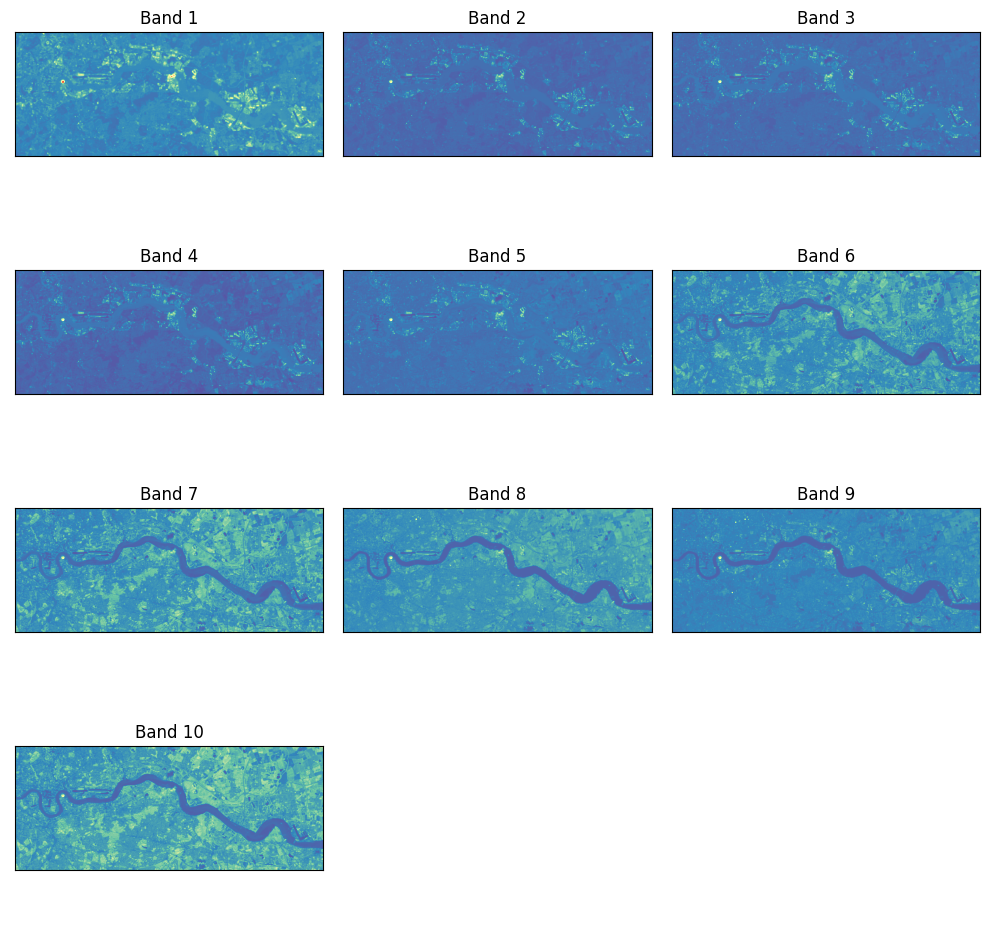

In [115]:
# Visalize Bands

ep.plot_bands(arr_bef, cmap='Spectral_r', cols=3, figsize=(10, 10), cbar=False)

plt.show()

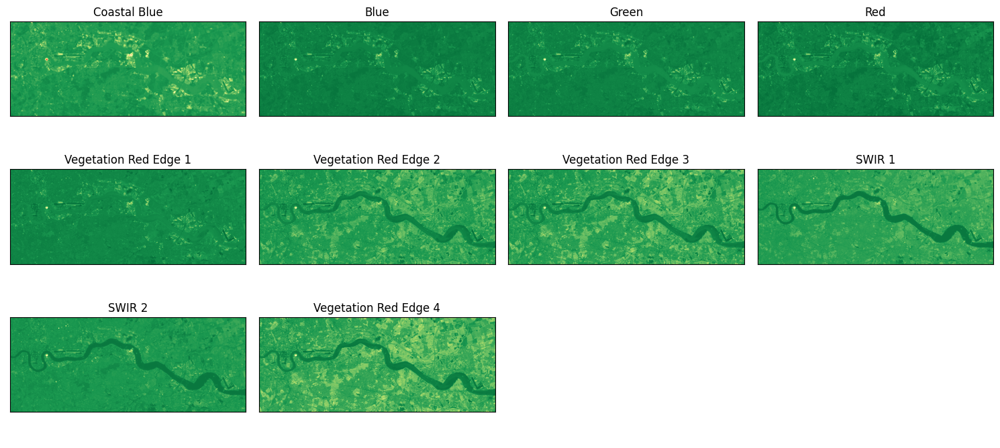

In [116]:
titles = ["Coastal Blue", "Blue", "Green",
          "Red", "Vegetation Red Edge 1", "Vegetation Red Edge 2",
          "Vegetation Red Edge 3", "SWIR 1", "SWIR 2", "Vegetation Red Edge 4"]

ep.plot_bands(arr_bef,
              cmap='RdYlGn_r',
              cols=4,
              figsize=(15, 7),
              cbar=False,
              title = titles)
plt.show()

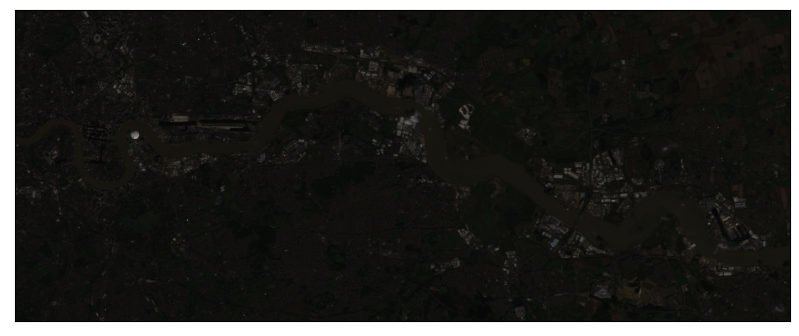

In [117]:
# Visualize RGB Composite Image

ep.plot_rgb(arr_bef, rgb=(3, 2, 1), figsize=(10, 10))

plt.show()

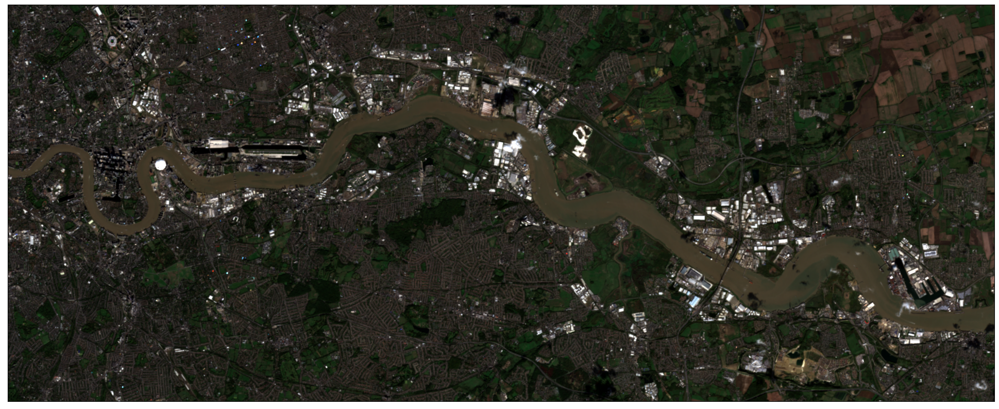

In [118]:
# RGB Composite Image with Stretching Histogram to make pixels brighter
ep.plot_rgb(arr_bef,
            rgb=(3, 2, 1),
            stretch=True,
            str_clip=0.2,
            figsize=(60, 10))
plt.show()

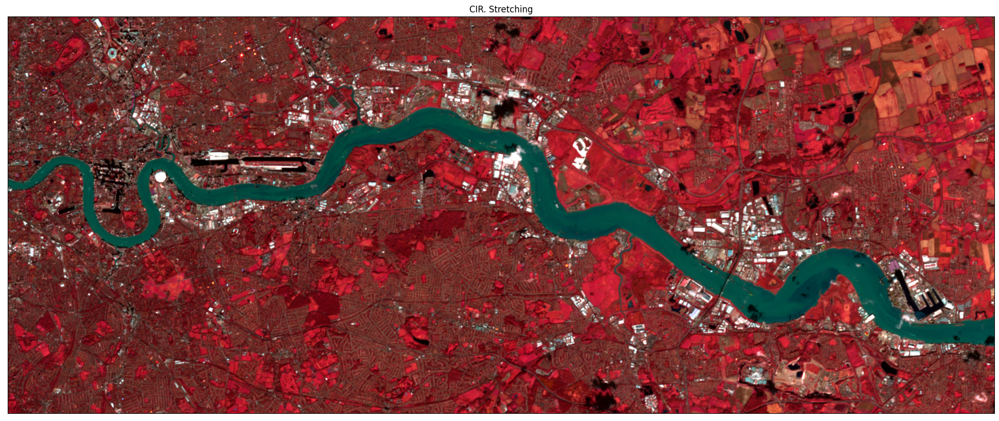

In [13]:
# Plot of CIR composite image with stretching
ax3 = ep.plot_rgb(
    arr_bef,
    rgb=(7, 3, 2),
    stretch=True,
    str_clip=0.5,
    figsize=(60, 10),
    title="CIR. Stretching"
)
plt.show()

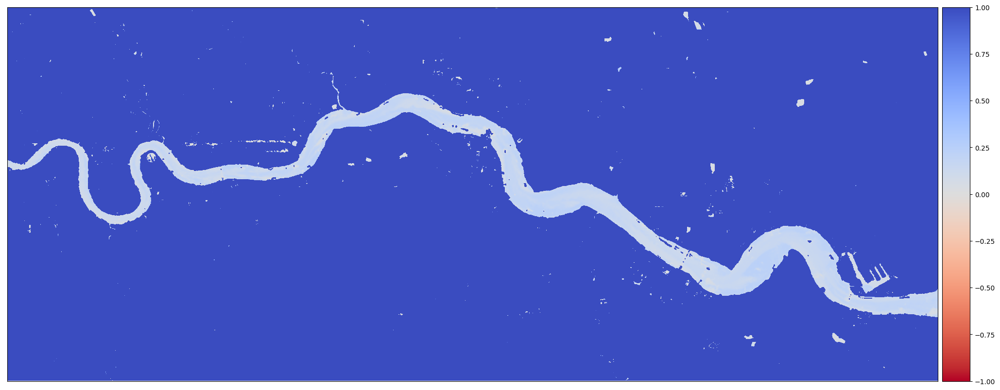

In [9]:
# Green is the 3rd band, but 3-1=2 in a python list, starting from 0
# NIR is the 8th band, but 8-1=7 in a python list, starting from 0

ndwi = es.normalized_diff(b1=arr_bef[2],
                              b2=arr_bef[9])
ep.plot_bands(ndwi,
              cmap='coolwarm_r',
              vmin=-1,
              vmax=1,
              figsize=(60, 10))
plt.show()

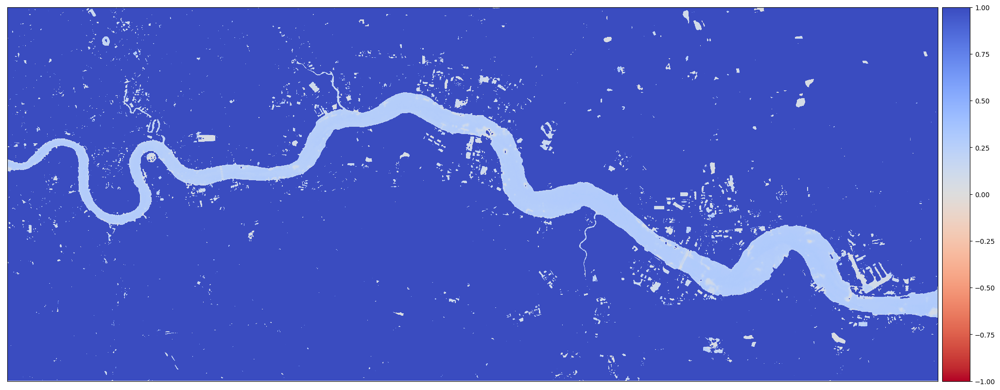

In [8]:
# Green is the 3th band, but 3-1=2 in a python list, starting from 0
# SWIR is the 12th band, but 12-1=11 in a python list, starting from 0
mndwi = es.normalized_diff(arr_bef[2], arr_bef[8])
ep.plot_bands(mndwi,
              cmap="coolwarm_r",
              cols=1,
              vmin=-1,
              vmax=1,
              figsize=(60, 10))
plt.show()